# A7 Parks-Focused Pilots — DOCUMENTATIE ABLATION (RUN-URI TERMINATE)

**Status**: ✅ Toti pilotii rulati. Modelul final selectat = A7-pilot1 → continuat in notebook 07.

**Atentie**: scripturile de antrenare au fost sterse dupa finalizarea proiectului (model in productie). Acest notebook ramane ca **documentatie a metodologiei** pentru capitolul Experimente din teza.

## Rezumat ablation (3 piloti, 30 epoci fiecare)

| Pilot | Variabila testata | Test mAP50 | Verdict |
|---|---|---:|---|
| A7-1 | DATELE (A7 vs A4) | **0.8466** | ★ cel mai bun, pornire pentru Detector final |
| A7-2 | REZOLUTIA (864 vs 640) | 0.8109 | mai prost cu imgsz mare la batch mic |
| A7-3 | MODELUL (yolo26m) | incomplet | 12× mai lent, mAP mai mic, abandonat |

**Concluzia**: yolov8s + predecesor + imgsz=640 + A7 dataset = combinatia optima. Aplicat in notebook 07.

In [1]:
from __future__ import annotations

import json
import os
import re
import subprocess
import sys
import time
from pathlib import Path

import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import pandas as pd
from IPython.display import Image, display


def find_repo_root(start: Path) -> Path:
    for candidate in (start, *start.parents):
        if (candidate / "backend").exists() and (candidate / "scripts").exists() and (candidate / "datasets").exists():
            return candidate
    raise RuntimeError("Nu gasesc radacina proiectului pornind din: " + str(start))


REPO = find_repo_root(Path.cwd().resolve())
os.chdir(REPO)

VENV_PYTHON = REPO / ".venv" / "Scripts" / "python.exe"
PYTHON = VENV_PYTHON if VENV_PYTHON.exists() else Path(sys.executable)

A7_DATA = REPO / "datasets" / "parks_detect_final" / "dataset.yaml"
A7_DIR = A7_DATA.parent
A7_REPORT = A7_DIR / "curation_report.json"

A4_EXT = REPO / "runs" / "archive" / "detect" / "parks-trash-predecesor" / "weights" / "best.pt"
YOLO26M = REPO / "models" / "pretrained" / "yolo26m.pt"

RUNS = {
    "A7-1": REPO / "runs" / "detect" / "parks-trash-A7-pilot1-a4ext-i640",
    "A7-2": REPO / "runs" / "detect" / "parks-trash-A7-pilot2-a4ext-i864",
    "A7-3": REPO / "runs" / "detect" / "parks-trash-A7-pilot3-yolo26-i640",
}

EPOCH_RE = re.compile(r"^\s*(\d+)/(\d+)\s+")


def run(args):
    cmd = [str(a) for a in args]
    print(">", " ".join(cmd), flush=True)
    env = {**os.environ, "PYTHONIOENCODING": "utf-8", "PYTHONUNBUFFERED": "1"}
    proc = subprocess.Popen(
        cmd,
        cwd=REPO,
        env=env,
        stdout=subprocess.PIPE,
        stderr=subprocess.STDOUT,
        bufsize=1,
        text=True,
        encoding="utf-8",
        errors="replace",
    )

    current_epoch = None
    epoch_start = None
    total_start = time.time()

    try:
        assert proc.stdout is not None
        for line in proc.stdout:
            match = EPOCH_RE.match(line)
            if match:
                epoch = int(match.group(1))
                total_epochs = int(match.group(2))
                if epoch != current_epoch:
                    now = time.time()
                    if current_epoch is not None and epoch_start is not None:
                        duration = (now - epoch_start) / 60
                        elapsed = (now - total_start) / 60
                        print("\n[EPOCH " + str(current_epoch) + "/" + str(total_epochs) + " done in " + f"{duration:.1f}" + " min; elapsed " + f"{elapsed:.1f}" + " min]\n", flush=True)
                    print("\n========== EPOCH " + str(epoch) + "/" + str(total_epochs) + " START ==========" , flush=True)
                    current_epoch = epoch
                    epoch_start = now
            print(line, end="", flush=True)
    finally:
        if proc.stdout is not None:
            proc.stdout.close()
        return_code = proc.wait()

    total_min = (time.time() - total_start) / 60
    print("\n[Process exited with code " + str(return_code) + "; total " + f"{total_min:.1f}" + " min]", flush=True)
    if return_code != 0:
        raise subprocess.CalledProcessError(return_code, cmd)
    return return_code


def count_images(split: str) -> int:
    image_dir = A7_DIR / "images" / split
    exts = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}
    return sum(1 for p in image_dir.iterdir() if p.suffix.lower() in exts)


print("Repo:", REPO)
print("Python:", PYTHON)
print("A7 dataset:", A7_DATA, "exists=", A7_DATA.exists())
print("predecesor:", A4_EXT, "exists=", A4_EXT.exists())
print("YOLO26m:", YOLO26M, "exists=", YOLO26M.exists())
print("A7 split counts:", {split: count_images(split) for split in ["train", "val", "test"]})

Repo: D:\TrashDetectionSystem
Python: D:\TrashDetectionSystem\.venv\Scripts\python.exe
A7 dataset: D:\TrashDetectionSystem\datasets\parks_detect_final\dataset.yaml exists= True
A4-ext: D:\TrashDetectionSystem\runs\archive\detect\parks-trash-A4-ext\weights\best.pt exists= True
YOLO26m: D:\TrashDetectionSystem\models\pretrained\yolo26m.pt exists= True
A7 split counts: {'train': 6213, 'val': 775, 'test': 780}


## 1. Validare dataset A7

Trebuie sa vezi:

- `Total indexed images: 7768`
- `[OK] Dataset structure is valid`

In [2]:
run([
    PYTHON,
    "scripts/data/validate_yolo_dataset.py",
    "--data", A7_DATA,
])

> D:\TrashDetectionSystem\.venv\Scripts\python.exe scripts/data/validate_yolo_dataset.py --data D:\TrashDetectionSystem\datasets\parks_detect_final\dataset.yaml
[INFO] Dataset root: D:\TrashDetectionSystem\datasets\parks_detect_final
[INFO] Classes (1): {0: 'trash'}
[INFO] Total indexed images: 7768
[OK] Dataset structure is valid for YOLO detection training

[Process exited with code 0; total 0.0 min]


0

## 2. Raport de curatare A7

Verificam ce a intrat in dataset si ce a fost eliminat. Acesta este important si pentru capitolul de experimente din licenta.

In [3]:
with open(A7_REPORT, encoding="utf-8") as f:
    report = json.load(f)

rows = []
for source, stats in report["stats_per_source"].items():
    copied = stats.get("copied_with_label", 0) + stats.get("copied_negative", 0)
    rows.append({
        "source": source,
        "total": stats.get("total", 0),
        "copied": copied,
        "skipped": stats.get("skipped", 0),
        "dropped_no_label": stats.get("dropped_no_label", 0),
        "train": stats.get("copied_train", 0),
        "val": stats.get("copied_val", 0),
        "test": stats.get("copied_test", 0),
    })

df_report = pd.DataFrame(rows).sort_values("copied", ascending=False)
display(df_report)
print("Total copiat:", int(df_report["copied"].sum()))

,source,total,copied,skipped,dropped_no_label,train,val,test
3,a6_person_trash,8210,5317,0,2893,4253,531,533
2,a6_parks_detect,2269,2236,0,33,1788,223,225
0,a6_illegal_dumping,404,215,0,189,172,21,22
1,a6_litter_aiengineer,6912,0,6912,0,0,0,0


Total copiat: 7768


## 3. Pilot A7-1 - predecesor + A7 + imgsz=640

Acesta este cel mai important prim test. Diferenta fata de predecesor este datasetul, nu modelul si nu rezolutia.

Seteaza `RUN_A7_1 = True` cand vrei sa pornesti. Estimare aproximativa: 2-4 ore pe RTX 3050, in functie de temperatura si cache.

In [4]:
RUN_A7_1 = True

if RUN_A7_1:
    run([
        PYTHON,
        "scripts/training/train_a7_pilot.py",
        "--data", A7_DATA,
        "--pilot", "a7_1",
        "--epochs", "30",
        "--patience", "8",
        "--lr0", "0.0005",
        "--workers", "4",
        "--cache", "False",
    ])
else:
    print("A7-1 este dezactivat. Seteaza RUN_A7_1 = False ca sa pornesti pilotul.")

> D:\TrashDetectionSystem\.venv\Scripts\python.exe scripts/training/train_a7_pilot.py --data D:\TrashDetectionSystem\datasets\parks_detect_final\dataset.yaml --pilot a7_1 --epochs 30 --patience 8 --lr0 0.0005 --workers 4 --cache False
  PILOT: a7_1
  A4-ext + A7 + imgsz=640 — testeaza efectul DATELOR
  Model start  : D:\TrashDetectionSystem\runs\archive\detect\parks-trash-A4-ext\weights\best.pt
  Dataset      : D:\TrashDetectionSystem\datasets\parks_detect_final\dataset.yaml
  Imgsz        : 640
  Batch        : 8
  Epochs       : 30  (patience=8)
  lr0          : 0.0005
  Workers      : 4
  Cache        : False
  Name         : parks-trash-A7-pilot1-a4ext-i640
  CUDA         : True
  GPU          : NVIDIA GeForce RTX 3050 Laptop GPU

New https://pypi.org/project/ultralytics/8.4.51 available  Update with 'pip install -U ultralytics'
Ultralytics 8.4.23  Python-3.12.13 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
engine\trainer: agnostic_nms=False, amp=True, ang

## 4. Analiza run A7-1

Ruleaza dupa ce se termina A7-1. Afiseaza curbele, metricile si predictiile pe validare.

Run dir: D:\TrashDetectionSystem\runs\detect\parks-trash-A7-pilot1-a4ext-i640
Exists: True
results.csv: True
Epoci rulate: 30
Ultima epoca: 30
Best mAP50: 0.8792 la epoch 30
mAP50-95 la best mAP50: 0.6023


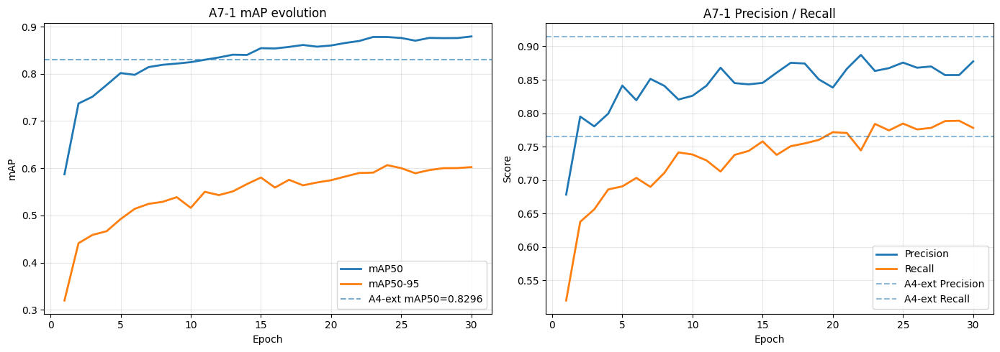

In [5]:
RUN_KEY = "A7-1"
RUN_DIR = RUNS[RUN_KEY]
RESULTS_CSV = RUN_DIR / "results.csv"

print("Run dir:", RUN_DIR)
print("Exists:", RUN_DIR.exists())
print("results.csv:", RESULTS_CSV.exists())

if RESULTS_CSV.exists():
    df = pd.read_csv(RESULTS_CSV)
    df.columns = df.columns.str.strip()
    last = df.iloc[-1]
    best_map50_idx = df["metrics/mAP50(B)"].idxmax()
    best_map50 = df.loc[best_map50_idx, "metrics/mAP50(B)"]
    best_map95 = df.loc[best_map50_idx, "metrics/mAP50-95(B)"]
    print("Epoci rulate:", len(df))
    print("Ultima epoca:", int(last["epoch"]))
    print("Best mAP50:", round(float(best_map50), 4), "la epoch", int(df.loc[best_map50_idx, "epoch"]))
    print("mAP50-95 la best mAP50:", round(float(best_map95), 4))

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    axes[0].plot(df["epoch"], df["metrics/mAP50(B)"], label="mAP50", linewidth=2)
    axes[0].plot(df["epoch"], df["metrics/mAP50-95(B)"], label="mAP50-95", linewidth=2)
    axes[0].axhline(0.8296, linestyle="--", alpha=0.6, label="predecesor mAP50=0.8296")
    axes[0].set_title("A7-1 mAP evolution")
    axes[0].set_xlabel("Epoch")
    axes[0].set_ylabel("mAP")
    axes[0].grid(alpha=0.3)
    axes[0].legend()

    axes[1].plot(df["epoch"], df["metrics/precision(B)"], label="Precision", linewidth=2)
    axes[1].plot(df["epoch"], df["metrics/recall(B)"], label="Recall", linewidth=2)
    axes[1].axhline(0.9148, linestyle="--", alpha=0.5, label="predecesor Precision")
    axes[1].axhline(0.7656, linestyle="--", alpha=0.5, label="predecesor Recall")
    axes[1].set_title("A7-1 Precision / Recall")
    axes[1].set_xlabel("Epoch")
    axes[1].set_ylabel("Score")
    axes[1].grid(alpha=0.3)
    axes[1].legend()
    plt.tight_layout()
    plt.show()
else:
    print("Nu exista inca results.csv. Ruleaza mai intai pilotul A7-1.")

results.png


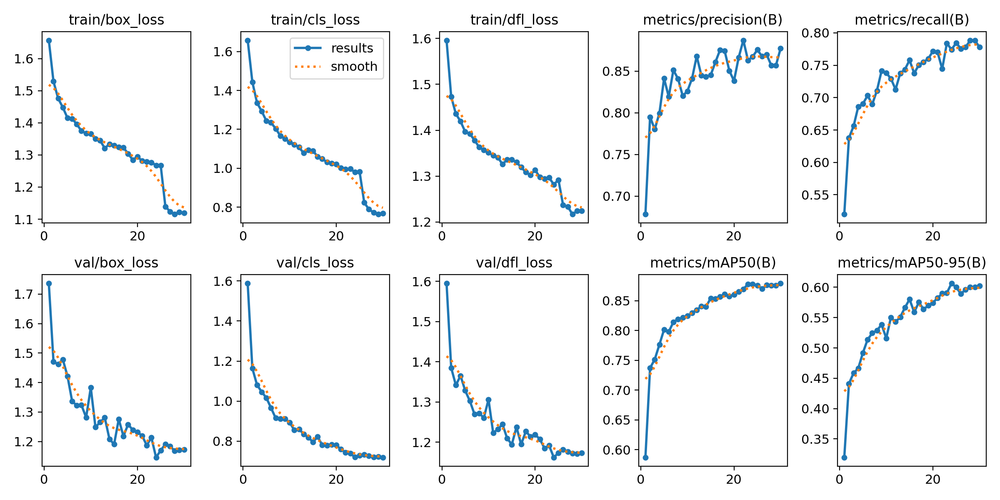

confusion_matrix_normalized.png


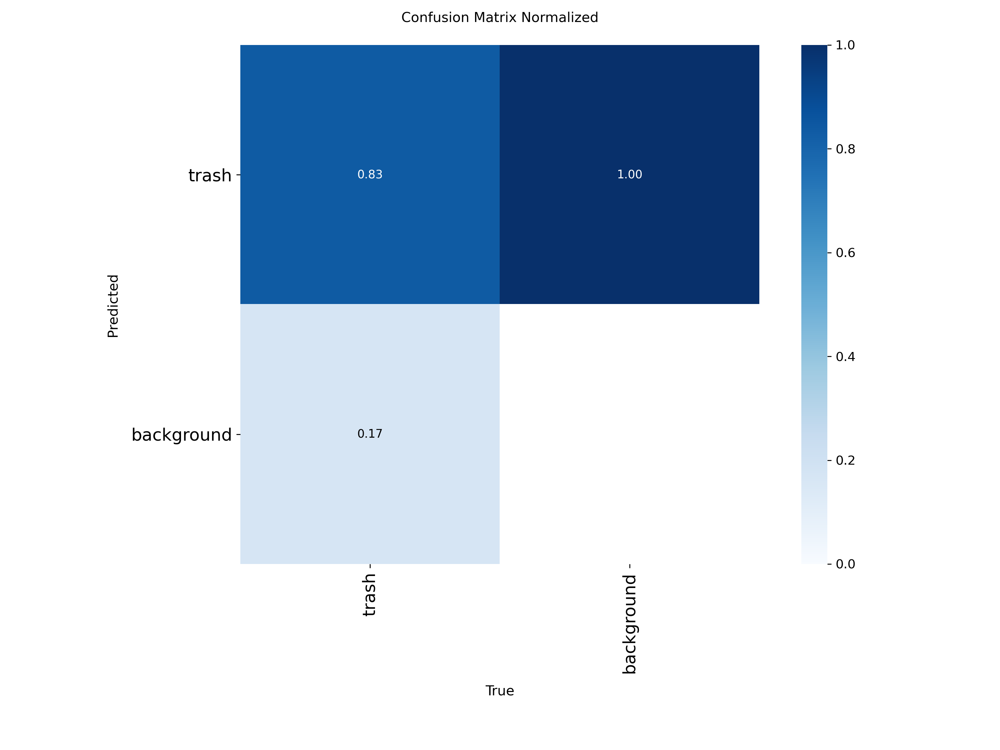

BoxPR_curve.png


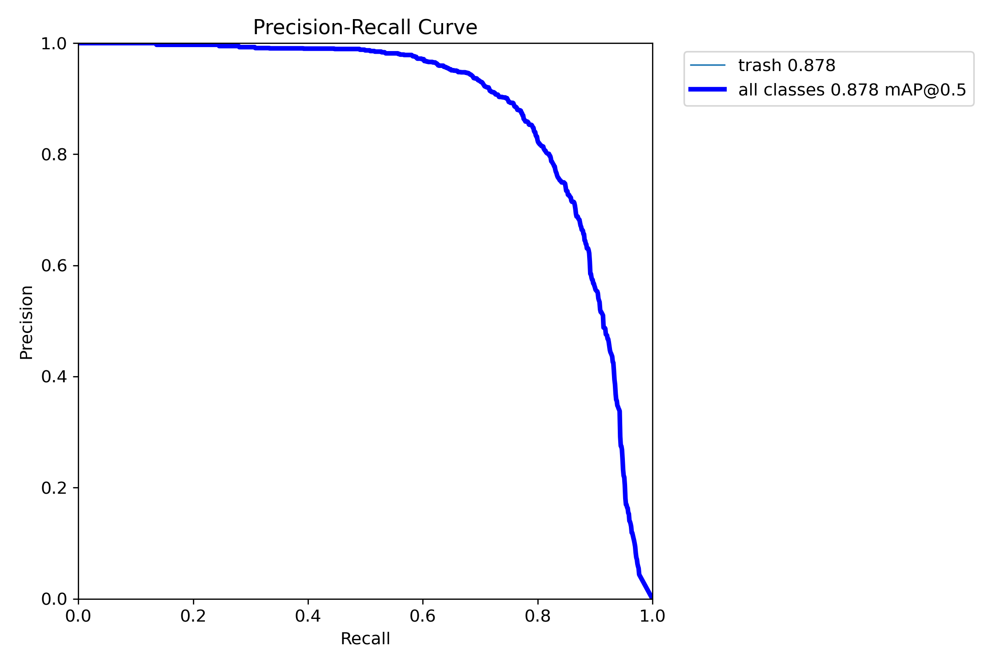

BoxF1_curve.png


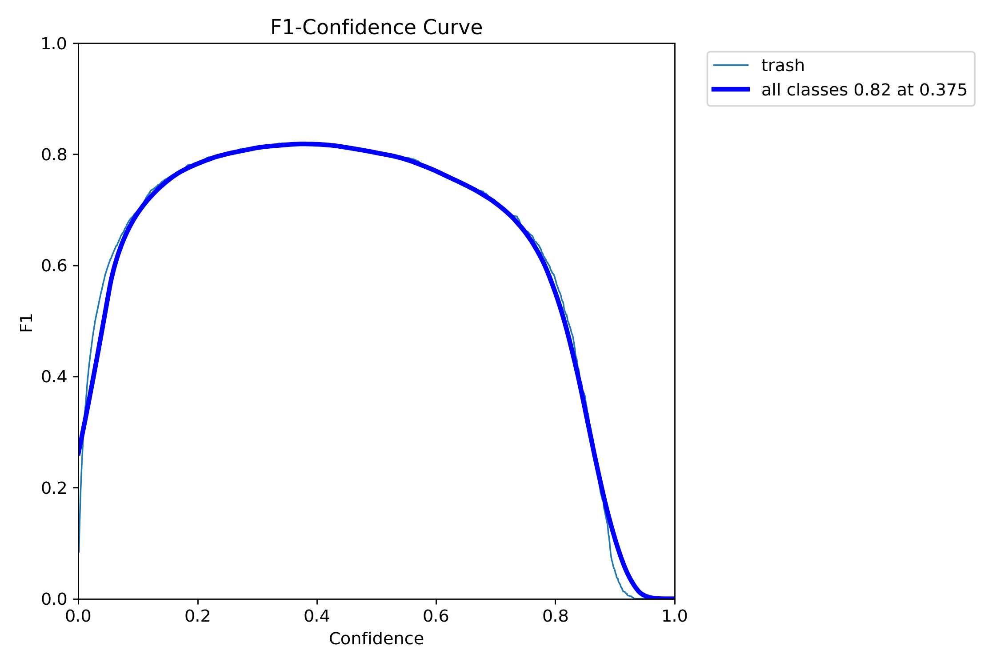

val_batch0_labels.jpg


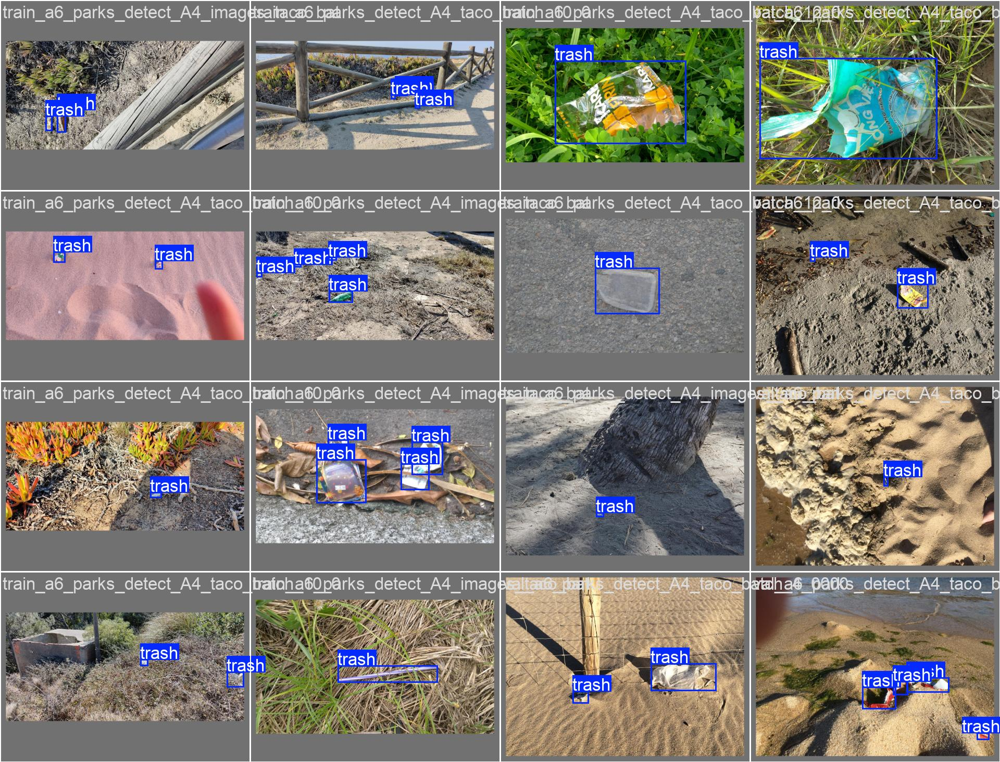

val_batch0_pred.jpg


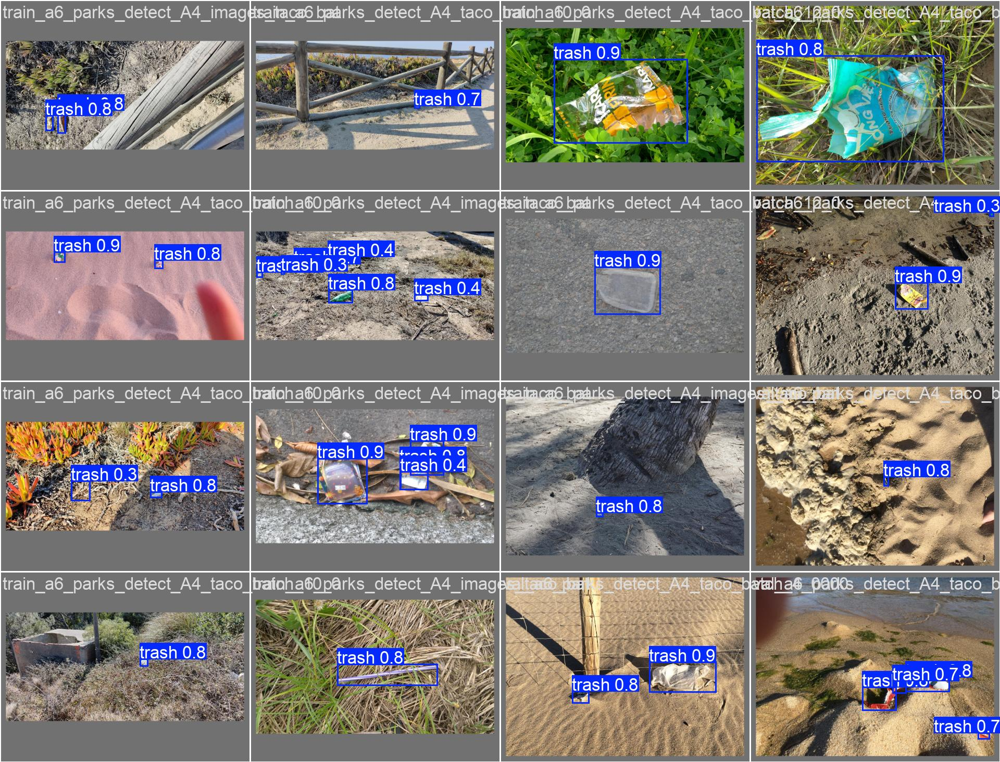

In [6]:
# Imagini generate de Ultralytics pentru inspectie vizuala.
for file_name, width in [
    ("results.png", 900),
    ("confusion_matrix_normalized.png", 650),
    ("BoxPR_curve.png", 700),
    ("BoxF1_curve.png", 700),
    ("val_batch0_labels.jpg", 800),
    ("val_batch0_pred.jpg", 800),
]:
    path = RUNS["A7-1"] / file_name
    if path.exists():
        print(file_name)
        display(Image(str(path), width=width))
    else:
        print("Lipseste:", path)

## 5. Pilot A7-2 - rezolutie mai mare

Ruleaza doar daca A7-1 arata bine. Aici pornim tot din predecesor, dar testam `imgsz=864` pentru obiecte mici.

In [7]:
RUN_A7_2 = True

if RUN_A7_2:
    run([
        PYTHON,
        "scripts/training/train_a7_pilot.py",
        "--data", A7_DATA,
        "--pilot", "a7_2",
        "--epochs", "30",
        "--patience", "8",
        "--lr0", "0.0005",
        "--workers", "4",
        "--cache", "False",
    ])
else:
    print("A7-2 este dezactivat. Ruleaza numai dupa analiza A7-1.")

> D:\TrashDetectionSystem\.venv\Scripts\python.exe scripts/training/train_a7_pilot.py --data D:\TrashDetectionSystem\datasets\parks_detect_final\dataset.yaml --pilot a7_2 --epochs 30 --patience 8 --lr0 0.0005 --workers 4 --cache False
  PILOT: a7_2
  A4-ext + A7 + imgsz=864 — testeaza efectul REZOLUTIEI
  Model start  : D:\TrashDetectionSystem\runs\archive\detect\parks-trash-A4-ext\weights\best.pt
  Dataset      : D:\TrashDetectionSystem\datasets\parks_detect_final\dataset.yaml
  Imgsz        : 864
  Batch        : 4
  Epochs       : 30  (patience=8)
  lr0          : 0.0005
  Workers      : 4
  Cache        : False
  Name         : parks-trash-A7-pilot2-a4ext-i864
  CUDA         : True
  GPU          : NVIDIA GeForce RTX 3050 Laptop GPU

New https://pypi.org/project/ultralytics/8.4.51 available  Update with 'pip install -U ultralytics'
Ultralytics 8.4.23  Python-3.12.13 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
engine\trainer: agnostic_nms=False, amp=True, 

## 6. Pilot A7-3 - YOLO26m

Da, incercam YOLO26m. Dar acesta este experiment comparativ: testeaza arhitectura, nu curatarea datelor.

In [ ]:
RUN_A7_3 = True

if RUN_A7_3:
    run([
        PYTHON,
        "scripts/training/train_a7_pilot.py",
        "--data", A7_DATA,
        "--pilot", "a7_3",
        "--epochs", "30",
        "--patience", "8",
        "--lr0", "0.001",
        "--workers", "4",
        "--cache", "False",
    ])
else:
    print("A7-3 YOLO26m este dezactivat. Ruleaza numai dupa A7-1/A7-2.")

> D:\TrashDetectionSystem\.venv\Scripts\python.exe scripts/training/train_a7_pilot.py --data D:\TrashDetectionSystem\datasets\parks_detect_final\dataset.yaml --pilot a7_3 --epochs 30 --patience 8 --lr0 0.001 --workers 4 --cache False
  PILOT: a7_3
  yolo26m + A7 + imgsz=640 — testeaza efectul MODELULUI
  Model start  : D:\TrashDetectionSystem\models\pretrained\yolo26m.pt
  Dataset      : D:\TrashDetectionSystem\datasets\parks_detect_final\dataset.yaml
  Imgsz        : 640
  Batch        : 8
  Epochs       : 30  (patience=8)
  lr0          : 0.001
  Workers      : 4
  Cache        : False
  Name         : parks-trash-A7-pilot3-yolo26-i640
  CUDA         : True
  GPU          : NVIDIA GeForce RTX 3050 Laptop GPU

New https://pypi.org/project/ultralytics/8.4.51 available  Update with 'pip install -U ultralytics'
Ultralytics 8.4.23  Python-3.12.13 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, a

## 7. Tabel comparativ final

Dupa ce ruleaza piloturile, acest tabel citeste metricile test salvate in `results/detector`.

## Concluzie operationala

- Daca A7-1 pastreaza sau imbunatateste performanta fata de predecesor, continuam cu A7-2.
- Daca A7-1 scade mult, datasetul A7 trebuie filtrat mai strict, probabil din `person_trash`.
- Daca A7-2 ajuta, pastram rezolutia mare pentru modelul final.
- YOLO26m se pastreaza ca experiment comparativ pentru lucrare, nu ca presupunere.